## Introduction

In this project, we will build a deep learning model to make a short-term temperature forcasting in Paris. Then build an API and dockerize it in a EC2 server. We will build a small gradio interface and use shap to clearly understand our model too.

This file is an EDA. The first goal is to define highlight patterns inside the data that can be used to forecast the temperature. The second is to determine which variables could enhance prediction performance. Then, calculating the correlation between the variables and the temperatures to assess their predictive value. These insights are decisive because the deep learning model will be build based on it.

## Exploratory Data Analysis (EDA)

### Exploration of the structure of the dataframe and removal of outliers

In [295]:
import pandas as pd

In [297]:
import numpy as np
import matplotlib.pyplot as plt

In [298]:
# Paris
longitude = 48.8489
latitude = 2.3550
timezone = "Europe/Paris"
start_date = "2015-01-01"
end_date = "2025-01-01"

In [299]:
# Import csv
df = pd.read_csv("meteo_data.csv") # Remove the information in the upper cell from the csv to have only the data

In [300]:
df.columns = ["Date", "Temperature", "Humidity", "Cloud cover", "Wind Speed", "Wind direction"] # Define columns

In [301]:
# Shape of csv
print(df.head())

               Date          Temperature                  Humidity  \
0               NaN                  NaN                       NaN   
1               NaN                  NaN                       NaN   
2              time  temperature_2m (°C)  relative_humidity_2m (%)   
3  2015-01-01T00:00                  0.4                        95   
4  2015-01-01T01:00                 -0.2                        97   

       Cloud cover             Wind Speed          Wind direction  
0              NaN                    NaN                     NaN  
1              NaN                    NaN                     NaN  
2  cloud_cover (%)  wind_speed_10m (km/h)  wind_direction_10m (°)  
3                2                    2.3                     252  
4                0                    2.5                     270  


In [302]:
# Description of csv 
df.describe()

,Date,Temperature,Humidity,Cloud cover,Wind Speed,Wind direction
count,87697,87697,87697,87697,87697,87697
unique,87697,466,87,102,459,362
top,time,11.5,92,100,7.6,360
freq,1,540,3027,26761,958,580


In [303]:
df = df.drop(df.index[[0,2]])

In [304]:
df["Temperature"] = pd.to_numeric(df["Temperature"], errors='coerce') # Convert text to float

In [305]:
df[1:25]

,Date,Temperature,Humidity,Cloud cover,Wind Speed,Wind direction
3,2015-01-01T00:00,0.4,95,2,2.3,252
4,2015-01-01T01:00,-0.2,97,0,2.5,270
5,2015-01-01T02:00,-0.6,97,0,3.0,256
6,2015-01-01T03:00,-0.9,97,15,4.2,250
7,2015-01-01T04:00,-1.1,98,27,5.4,233
8,2015-01-01T05:00,-1.8,98,62,6.6,221
9,2015-01-01T06:00,-3.2,97,62,5.4,200
10,2015-01-01T07:00,-2.9,97,62,5.5,203
11,2015-01-01T08:00,-2.7,97,62,6.8,238
12,2015-01-01T09:00,-2.8,97,66,4.0,190


In [306]:
# Verify if there are duplicates
doublons = df[df.duplicated(subset=['Date'])]
print(doublons)

Empty DataFrame
Columns: [Date, Temperature, Humidity, Cloud cover, Wind Speed, Wind direction]
Index: []


### Temperature analysis

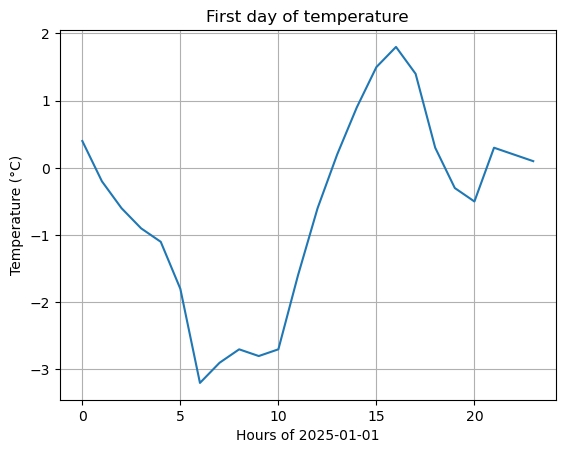

In [308]:
# Print the temperatures of 215-01-01
temps = df["Temperature"][1:25]
plt.plot(range(24), temps)
plt.title("First day of temperature")
plt.xlabel("Hours of 2025-01-01")
plt.ylabel("Temperature (°C)")
plt.grid(True)
plt.show()

In [309]:
df = df.iloc[1:]

In [310]:
# Compute the 40 hourly mean of the temperature for the 40 first days
data_aff = df["Temperature"].head(960).to_numpy() # 40 days = 960 hours
M = np.zeros(24)
for i in range(960):
    M[i%24] += data_aff[i]
M = M/40

In [311]:
days = data_aff.reshape((40, 24))
S = days.std(axis=0) # std of the hourly temperature for the 40 first days

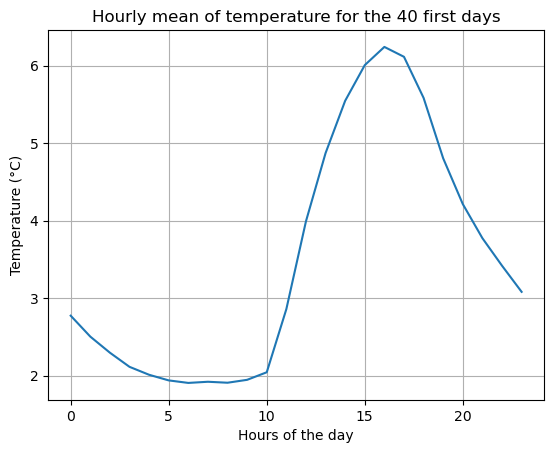

In [312]:
# Print the hourly mean
plt.plot(range(24), M)
plt.title("Hourly mean of temperature for the 40 first days")
plt.xlabel("Hours of the day")
plt.ylabel("Temperature (°C)")
plt.grid(True)
plt.show()

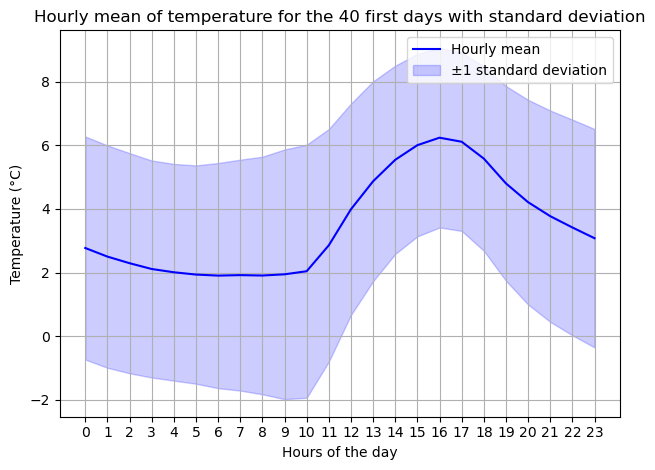

In [313]:
plt.plot(range(24), M, color='blue', label='Hourly mean')

plt.fill_between(range(24),
                 M - S,
                 M + S,
                 color='blue',
                 alpha=0.2,
                 label='±1 standard deviation')

plt.title("Hourly mean of temperature for the 40 first days with standard deviation")
plt.xlabel("Hours of the day")
plt.ylabel("Temperature (°C)")
plt.xticks(range(24))
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

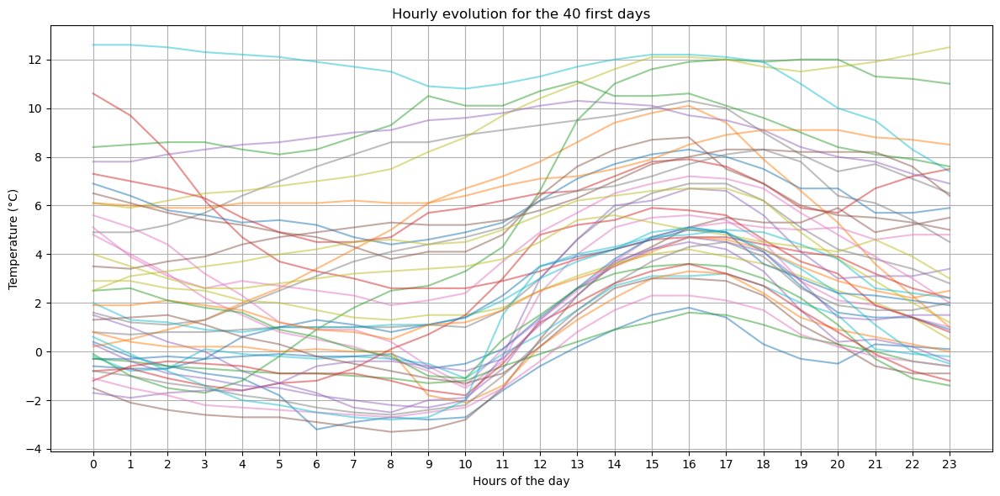

In [314]:
# Compare the previous graph with the 40 first days printed
# Print the 40 first days
plt.figure(figsize=(12, 6))
for day in range(40):
    plt.plot(range(24), days[day], alpha=0.5, label=f"Day {day+1}")

plt.title("Hourly evolution for the 40 first days")
plt.xlabel("Hours of the day")
plt.ylabel("Temperature (°C)")
plt.xticks(range(24))
plt.grid(True)
plt.tight_layout()
plt.show()

We can notice several things about the previous graphs.
 - The hourly mean seems to highlight a pattern : low temperature and decreasement during early morning, minimum around 6-7a.m., increasement during the morning and the afternoon, maximum around 3-4p.m., decreasement until the next morning.
 - The hourly mean with standard deviation underline the fact that the temperature is varying around the mean. Temperatures fluctuates with most values falling within ±3 hours of the average (in time). The relatively high standard deviation reflects variations due to external factors such as the month, season, and specific weather conditions.
 - The last one are the hourly temperatures of the 40 first days. We can observe the big difference according to the day the recording has been made. It is for the first 40 days, it is winter in Paris, so we observe that a big part of the curves are in a narrow range of 2 hours (typically between -2°C and 0°C during the morning and 2°C and 4°C the afternoon). It confirms both the presence of a daily cycle and the strong influence of external seasonal effects.

In [316]:
df = df.copy()
df['Date'] = pd.to_datetime(df['Date'])

In [317]:
# Verification of leap year
hours_by_year = df.groupby(df['Date'].dt.year).size()
print(hours_by_year)

Date
2015    8760
2016    8784
2017    8760
2018    8760
2019    8760
2020    8784
2021    8760
2022    8760
2023    8760
2024    8784
2025      24
dtype: int64


In [318]:
# Verification of hour change
hours_by_day = df.groupby(df["Date"].dt.date).size()
print(hours_by_day)

Date
2015-01-01    24
2015-01-02    24
2015-01-03    24
2015-01-04    24
2015-01-05    24
              ..
2024-12-28    24
2024-12-29    24
2024-12-30    24
2024-12-31    24
2025-01-01    24
Length: 3654, dtype: int64


In [319]:
hours_by_day[hours_by_day == 23].index.tolist()
hours_by_day[hours_by_day == 25].index.tolist()
# The hour change could be managed by the database directly

[]

In [320]:
data_aff_1y = df["Temperature"].head(8760).to_numpy() # 365 days = 8760 hours
M_1y = np.zeros(24)
for i in range(8760):
    M_1y[i%24] += data_aff_1y[i]
M_1y = M_1y/365
days_1y = data_aff_1y.reshape((365, 24))
S_1y = days_1y.std(axis=0) # std of the hourly temperature for the first year

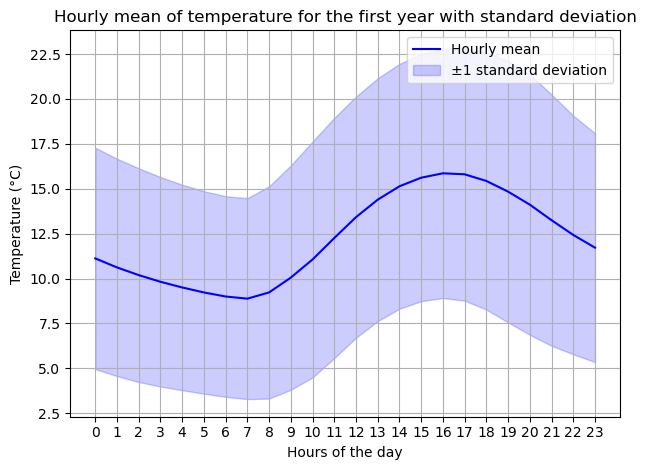

In [321]:
# Same graphs with one year

plt.plot(range(24), M_1y, color='blue', label='Hourly mean')

plt.fill_between(range(24),
                 M_1y - S_1y,
                 M_1y + S_1y,
                 color='blue',
                 alpha=0.2,
                 label='±1 standard deviation')

plt.title("Hourly mean of temperature for the first year with standard deviation")
plt.xlabel("Hours of the day")
plt.ylabel("Temperature (°C)")
plt.xticks(range(24))
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

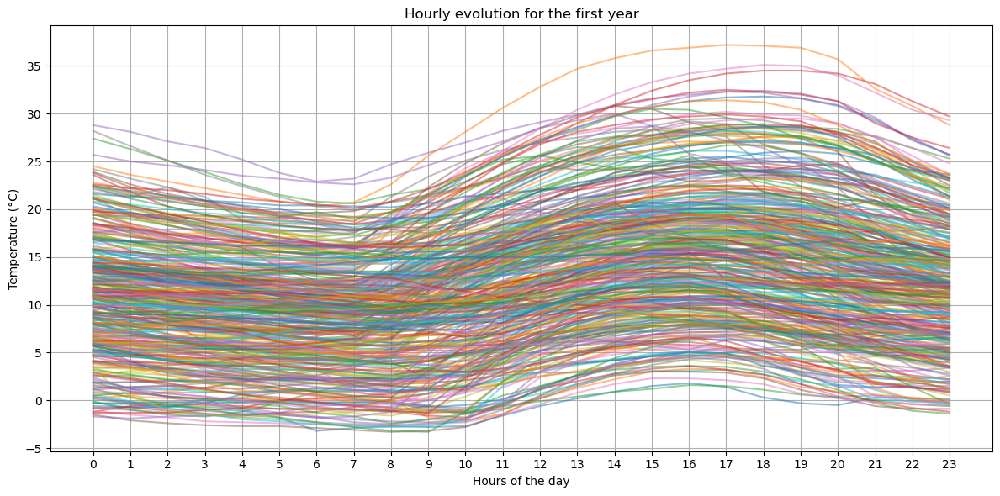

In [322]:
plt.figure(figsize=(12, 6))
for day in range(365):
    plt.plot(range(24), days_1y[day], alpha=0.5, label=f"Day {day+1}")

plt.title("Hourly evolution for the first year")
plt.xlabel("Hours of the day")
plt.ylabel("Temperature (°C)")
plt.xticks(range(24))
plt.grid(True)
plt.tight_layout()
plt.show()

For one year, we observe the same shape and trends. The standard deviation is higher that is normal because we take into account the summer and winter temperatures.

In [324]:
M_seas = []
S_seas = []

for month in range(1, 13):
    # Filter the dataframe according to the month
    df_month = df[df['Date'].dt.month == month]
    
    # We take the temperatures
    n_days = df_month['Date'].dt.date.nunique()
    temp_values = df_month['Temperature'].to_numpy()
    
    # We build 24 hours days
    days = temp_values[:(n_days * 24)].reshape((n_days, 24))

    # Mean and std
    M_month = days.mean(axis=0)
    S_month = days.std(axis=0)

    M_seas.append(M_month)
    S_seas.append(S_month)

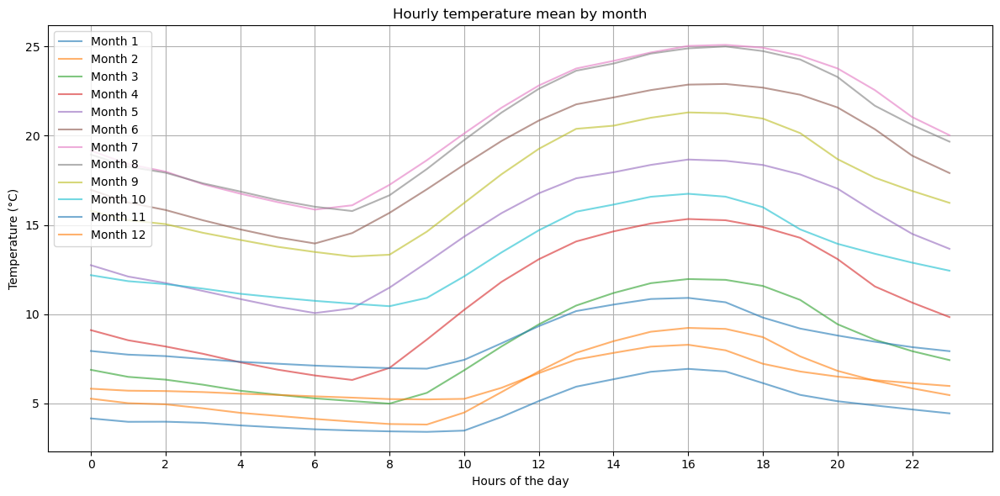

In [325]:
plt.figure(figsize=(12, 6))
for month in range(12):
    plt.plot(range(24), M_seas[month], alpha=0.6, label=f"Month {month+1}")

plt.title("Hourly temperature mean by month")
plt.xlabel("Hours of the day")
plt.ylabel("Temperature (°C)")
plt.xticks(range(0, 24, 2))
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

What we can notice about that graph is the hourly temperature mean for each month as the same shape of the others. The difference between each month is the global temperature mean of each month. The second observation is the decreasment of the curve and the increasment (the slope) is higher for the months with hotter temperatures than for the ones with colder temperatures. 

### Humidity Analysis

In [328]:
# Mean graph of the humidity for the first year with std
data_hum_aff_1y = df["Humidity"].head(8760).astype(float).to_numpy() # 365 days = 8760 hours
MH_1y = np.zeros(24)
for i in range(8760):
    MH_1y[i%24] += data_hum_aff_1y[i]
MH_1y = MH_1y/365
days_hum_1y = data_hum_aff_1y.reshape((365, 24))
SH_1y = days_hum_1y.std(axis=0) # std of the hourly temperature for the first year

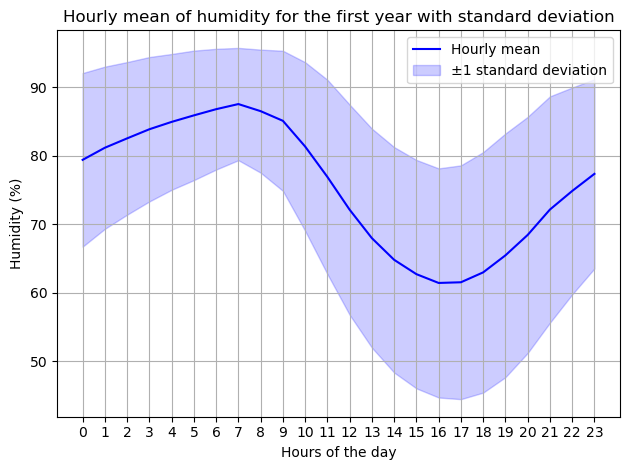

In [329]:
plt.plot(range(24), MH_1y, color='blue', label='Hourly mean')

plt.fill_between(range(24),
                 MH_1y - SH_1y,
                 MH_1y + SH_1y,
                 color='blue',
                 alpha=0.2,
                 label='±1 standard deviation')

plt.title("Hourly mean of humidity for the first year with standard deviation")
plt.xlabel("Hours of the day")
plt.ylabel("Humidity (%)")
plt.xticks(range(24))
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

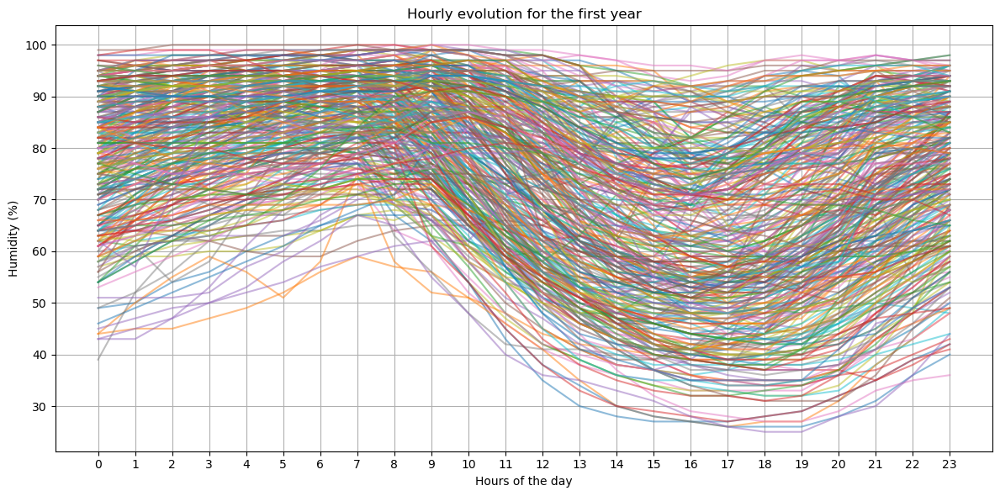

In [330]:
plt.figure(figsize=(12, 6))
for day in range(365):
    plt.plot(range(24), days_hum_1y[day], alpha=0.5, label=f"Day {day+1}")

plt.title("Hourly evolution for the first year")
plt.xlabel("Hours of the day")
plt.ylabel("Humidity (%)")
plt.xticks(range(24))
plt.grid(True)
plt.tight_layout()
plt.show()

In [331]:
MH_seas = []
SH_seas = []

for month in range(1, 13):
    # Filter the dataframe according to the month
    df_month = df[df['Date'].dt.month == month]
    
    # We take the temperatures
    n_days = df_month['Date'].dt.date.nunique()
    temp_values = df_month['Humidity'].astype(float).to_numpy()
    
    # We build 24 hours days
    days = temp_values[:(n_days * 24)].reshape((n_days, 24))

    # Mean and std
    M_month = days.mean(axis=0)
    S_month = days.std(axis=0)

    MH_seas.append(M_month)
    SH_seas.append(S_month)

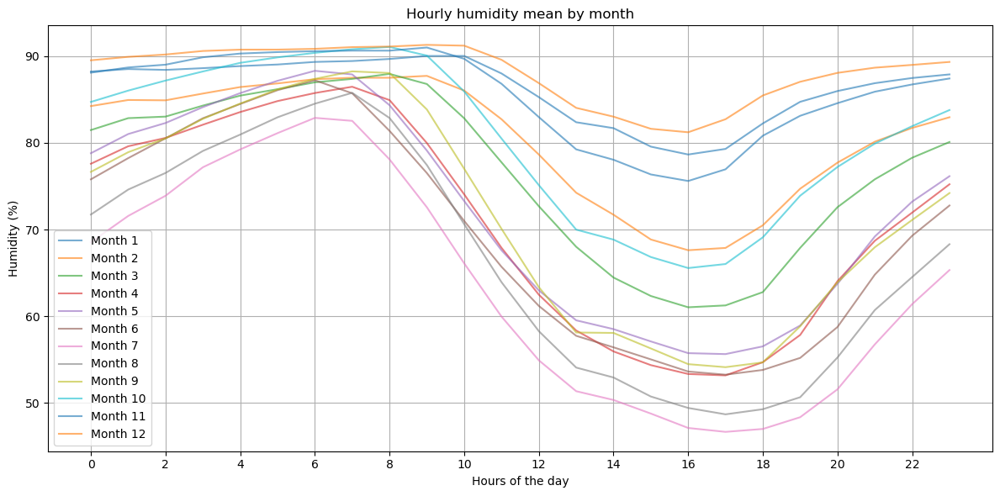

In [332]:
plt.figure(figsize=(12, 6))
for month in range(12):
    plt.plot(range(24), MH_seas[month], alpha=0.6, label=f"Month {month+1}")

plt.title("Hourly humidity mean by month")
plt.xlabel("Hours of the day")
plt.ylabel("Humidity (%)")
plt.xticks(range(0, 24, 2))
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

Several insights can be highlighted from the graphs of the humidity in Paris. First, a clear daily pattern emerges : humidity reaches a maximum around 7 a.m. and a minimum around 4 p.m. The average humidity level differs across months so, the curves have a different average value but the same shape.

This variability contributes to a relatively high standard deviation, particularly around 4 p.m., where it can reach up to 18%. The standard deviation is increasing from the end of the morning to the minimum mean around 4p.m. This may be due to the fact that afternoons can vary widely between very dry and very humid, depending on weather conditions, whereas mornings and evenings are more stable, with rarely very dry conditions in Paris.

Interestingly, the shape of the humidity curve is approximately the inverse of the temperature curve: as temperature rises, humidity tends to drop, and vice versa. This inverse relationship suggests that the slope of the humidity curve could serve as a useful indicator for short-term temperature forecasting.

### Cloud Cover Analysis

In [335]:
# Mean graph of the cloud cover for the first year with std
data_cc_aff_1y = df["Cloud cover"].head(8760).astype(float).to_numpy() # 365 days = 8760 hours
MCC_1y = np.zeros(24)
for i in range(8760):
    MCC_1y[i%24] += data_cc_aff_1y[i]
MCC_1y = MCC_1y/365
days_cc_1y = data_cc_aff_1y.reshape((365, 24))
SCC_1y = days_cc_1y.std(axis=0) # std of the hourly temperature for the first year

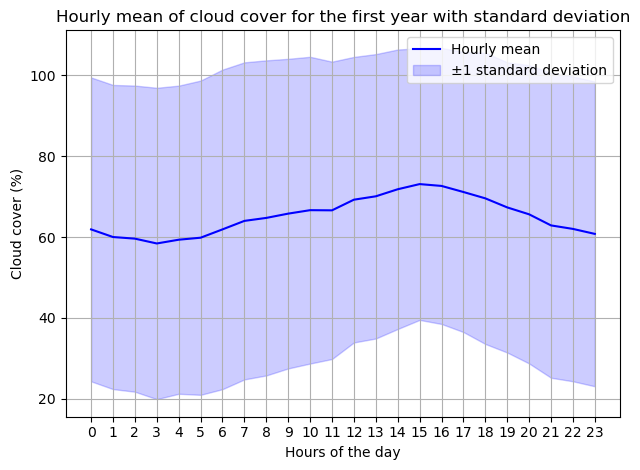

In [336]:
plt.plot(range(24), MCC_1y, color='blue', label='Hourly mean')

plt.fill_between(range(24),
                 MCC_1y - SCC_1y,
                 MCC_1y + SCC_1y,
                 color='blue',
                 alpha=0.2,
                 label='±1 standard deviation')

plt.title("Hourly mean of cloud cover for the first year with standard deviation")
plt.xlabel("Hours of the day")
plt.ylabel("Cloud cover (%)")
plt.xticks(range(24))
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

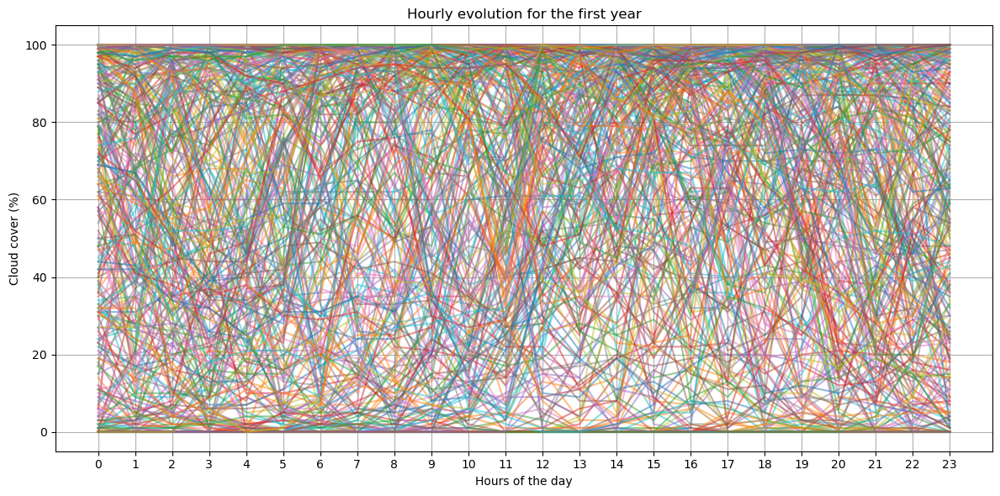

In [337]:
plt.figure(figsize=(12, 6))
for day in range(365):
    plt.plot(range(24), days_cc_1y[day], alpha=0.5, label=f"Day {day+1}")

plt.title("Hourly evolution for the first year")
plt.xlabel("Hours of the day")
plt.ylabel("Cloud cover (%)")
plt.xticks(range(24))
plt.grid(True)
plt.tight_layout()
plt.show()

In [338]:
MCC_seas = []
SCC_seas = []

for month in range(1, 13):
    # Filter the dataframe according to the month
    df_month = df[df['Date'].dt.month == month]
    
    # We take the temperatures
    n_days = df_month['Date'].dt.date.nunique()
    temp_values = df_month['Cloud cover'].astype(float).to_numpy()
    
    # We build 24 hours days
    days = temp_values[:(n_days * 24)].reshape((n_days, 24))

    # Mean and std
    M_month = days.mean(axis=0)
    S_month = days.std(axis=0)

    MCC_seas.append(M_month)
    SCC_seas.append(S_month)

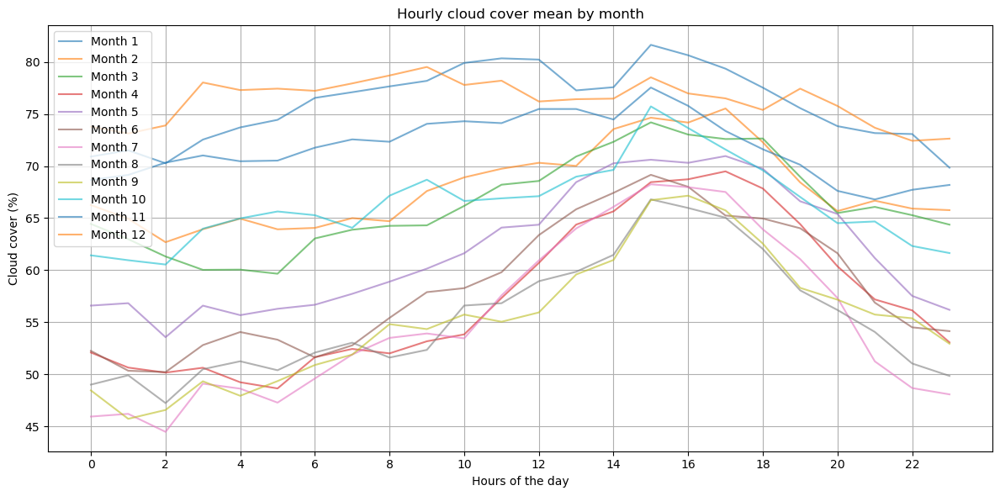

In [339]:
plt.figure(figsize=(12, 6))
for month in range(12):
    plt.plot(range(24), MCC_seas[month], alpha=0.6, label=f"Month {month+1}")

plt.title("Hourly cloud cover mean by month")
plt.xlabel("Hours of the day")
plt.ylabel("Cloud cover (%)")
plt.xticks(range(0, 24, 2))
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

There is no unique daily pattern in cloud cover, but rather seasonal trends. During the summer, cloud cover tends to increase from morning until approximately 4 p.m., a pattern that is also observed—though less markedly—during the spring. During winter and automn, the cloud cover is approximately stable. 

These seasonal dynamics may be linked to meteorological phenomena such as the formation of convective clouds driven by rising afternoon temperatures. Then, it could be interesting to give to our model a seasonal indicator into predictive models to better capture context-dependent variations.

However, the very high standard deviation observed—particularly in the afternoon—suggests that cloud cover is highly variable from one day to another, making it difficult to identify consistent hourly trends.

This suggests that cloud cover is highly variable from one day to another, making it more difficult to identify consistent hourly patterns. The effects of cloud cover on temperature are complex and can act in both directions: clouds can contribute to temperature increase by trapping infrared radiation emitted by the Earth, especially at night, or they can lead to a temperature decrease by blocking incoming solar radiation during the day.

### Wind Analysis

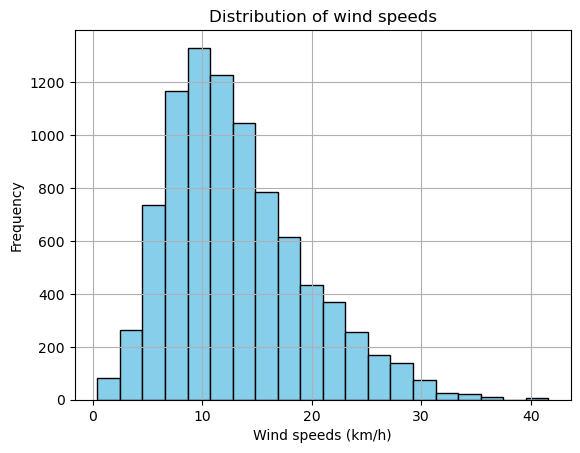

In [342]:
# Histogram of the wind speeds
plt.hist(df["Wind Speed"].head(8760).astype(float).to_numpy(), bins=20, color="skyblue", edgecolor="black")
plt.title("Distribution of wind speeds")
plt.xlabel("Wind speeds (km/h)")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

In [343]:
pip install windrose

Note: you may need to restart the kernel to use updated packages.


In [344]:
from windrose import WindroseAxes

In [345]:
#Conversions
wind_dir = pd.to_numeric(df['Wind direction'].head(8760), errors='coerce')
wind_speed = pd.to_numeric(df['Wind Speed'].head(8760), errors='coerce')

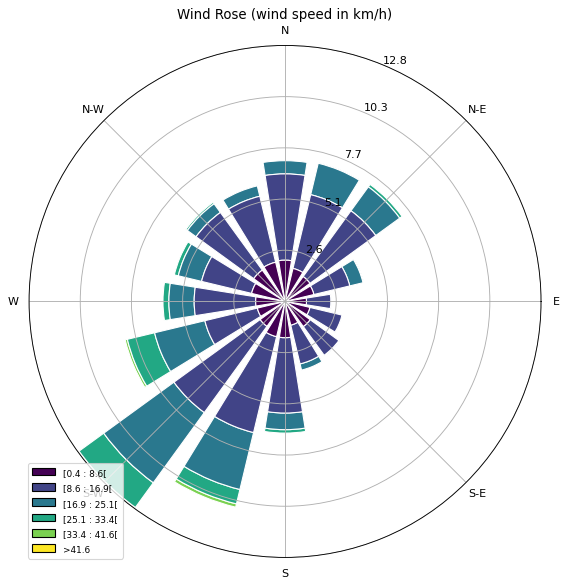

In [346]:
# Print a wind rose to see the speed and the direction of the wind at the same time
axx = WindroseAxes.from_ax()
axx.bar(wind_dir, wind_speed, normed=True, opening=0.8, edgecolor='white') 
axx.set_legend() # Wind in km/h and angle in rad
plt.title("Wind Rose (wind speed in km/h)")
plt.show()

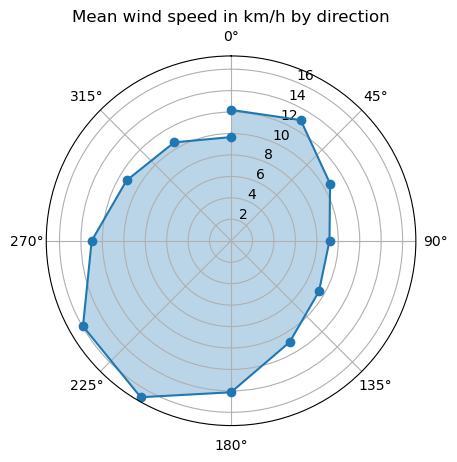

In [347]:
df_bis = df[['Wind Speed', 'Wind direction']].head(8760).copy()
df_bis['Wind Speed'] = df_bis['Wind Speed'].astype(float)
df_bis['Wind direction'] = df_bis['Wind direction'].astype(float)

# Discretize the wind direction by range of 30°
df_bis['Wind Dir Bin'] = (df_bis['Wind direction'] // 30) * 30
mean_speeds = df_bis.groupby("Wind Dir Bin")["Wind Speed"].mean()

angles = np.deg2rad(mean_speeds.index)
values = mean_speeds.values

# Polar graph
fig = plt.figure()
ax = fig.add_subplot(111,polar=True)
ax.plot(angles, values, marker='o')
ax.fill(angles, values, alpha=0.3)
ax.set_theta_zero_location("N") # North is 0°
ax.set_theta_direction(-1) # Clockwise direction
ax.set_title("Mean wind speed in km/h by direction")
plt.show()

In [348]:
import seaborn as sns

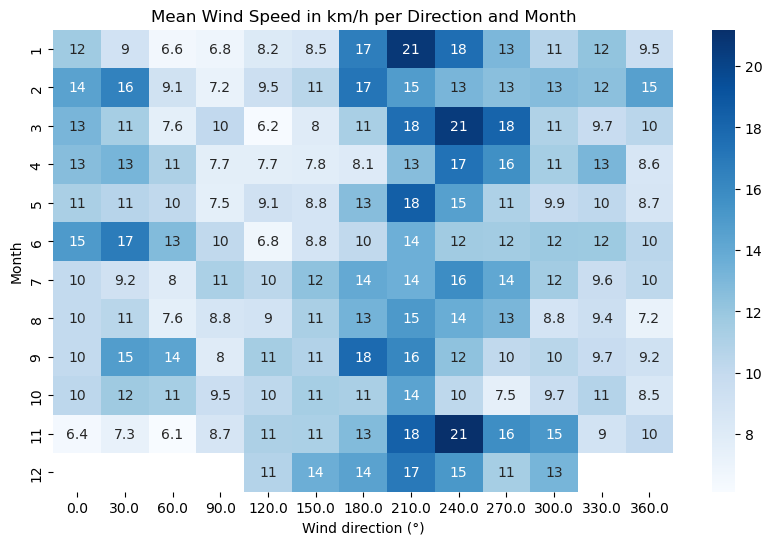

In [349]:
# Print a heatmap with the mean wind speed by month and by direction
df_bis["Month"] = df["Date"].head(8760).dt.month

grouped_speed = df_bis.groupby(['Month', 'Wind Dir Bin'])['Wind Speed'].mean().reset_index()

pivoted_df_bis = grouped_speed.pivot(index='Month', columns='Wind Dir Bin', values='Wind Speed')

plt.figure(figsize=(10,6))
sns.heatmap(pivoted_df_bis, cmap='Blues', annot=True)
plt.title("Mean Wind Speed in km/h per Direction and Month")
plt.ylabel("Month")
plt.xlabel("Wind direction (°)")
plt.show()

It is difficult to analyze properly the wind data because it is nosense to just analyse the wind speed or direction alone, both are strongly linked to each other, we have to analyze them together so we have to print 3D graphs and polar graphs. 

First we see the distribution of the wind speeds with the histogram. It has approximately the shape of a skewed gaussian curve. The wind speeds are mainly around 11km/h and decline is slower than growth. 

Then, the wind rose brings us the ability to see (with intervals of 30°) where the wind comes from, from which direction the wind mainly comes from and for each direction and the range of speed for each direction. We see clearly that the wind comes mainly from the south-east with a value between 8.6km/h and 25.1km/h. The wind rarely comes from the south-east and east, while it is more frequent from the south-west and south-west sectors. The wind comes approximately in the same way from the north, north-east, north-west and west. 

The third graph completes the wind rose. It shows the average wind speed according to the direction. It confirms the previous interpretation but the mean smoothens the differences so the wind speed from the south-east is not that different to the speed from the north-west for instance. 

Lastly, the heatmap sheds the light on the mean wind speed according to the month and the direction. It confirms that winds predominantly come from the south-west, often with higher average speeds. We can notice that some months are windier than the other, for instance November, January and March are windier than the others. Moreover, the dominant wind direction varies by season, suggesting a dynamic interaction between atmospheric pressure systems and local geography. A possible explanation for increased wind speeds during these months could be their association with periods of strong thermal contrast, such as seasonal transitions involving significant warming or cooling. These thermal gradients are known to drive stronger winds due to increased pressure differentials.

Together, these visuals suggest a strong spatio-temporal structure in wind behavior in Paris, which is essential to consider for weather modeling or environmental applications.

In [351]:
MWS_seas = []
SWS_seas = []

for month in range(1, 13):
    # Filter the dataframe according to the month
    df_month = df[df['Date'].dt.month == month]
    
    # We take the temperatures
    n_days = df_month['Date'].dt.date.nunique()
    temp_values = df_month['Wind Speed'].astype(float).to_numpy()
    
    # We build 24 hours days
    days = temp_values[:(n_days * 24)].reshape((n_days, 24))

    # Mean and std
    M_month = days.mean(axis=0)
    S_month = days.std(axis=0)

    MWS_seas.append(M_month)
    SWS_seas.append(S_month)

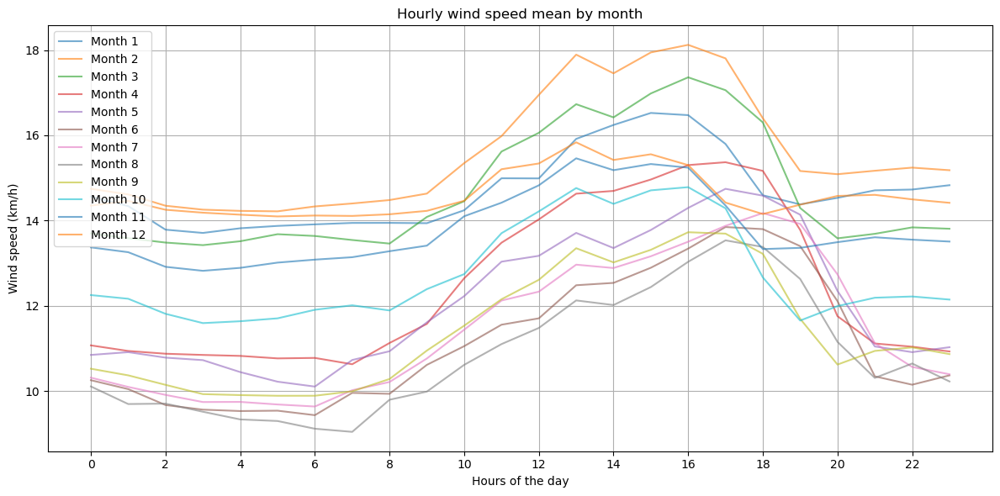

In [352]:
plt.figure(figsize=(12, 6))
for month in range(12):
    plt.plot(range(24), MWS_seas[month], alpha=0.6, label=f"Month {month+1}")

plt.title("Hourly wind speed mean by month")
plt.xlabel("Hours of the day")
plt.ylabel("Wind speed (km/h)")
plt.xticks(range(0, 24, 2))
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

A daily pattern in wind speed is observed throughout the year, with a peak typically occurring about one hour before the daily maximum temperature. This suggests a potential link between wind dynamics and surface heating. Wind may contribute to temperature increase indirectly by enhancing mixing of air layers, facilitating heat exchange, or influencing humidity and cloud cover. These interactions highlight the possible predictive power of wind speed and direction for short-term and long-term temperature forecasting.

### Correlation between the variables

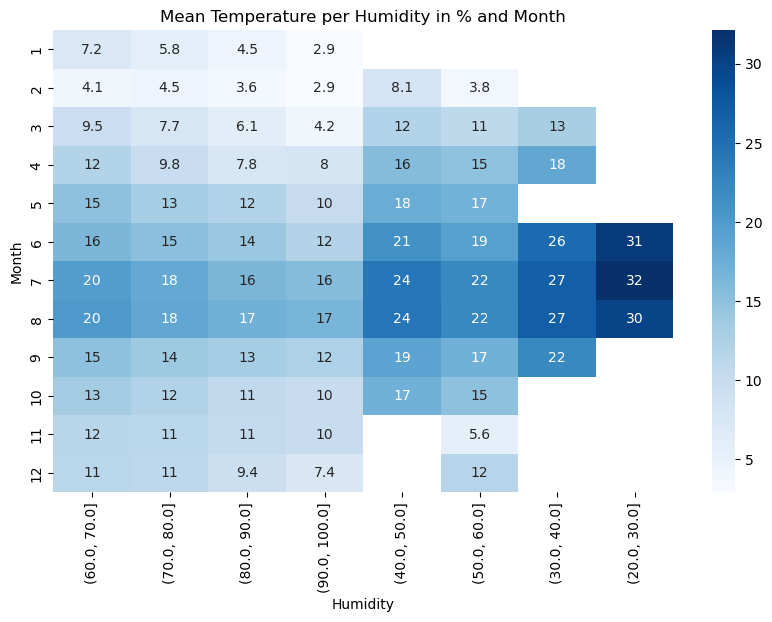

In [356]:
# Print a heatmap with the mean temperature by month and by Humidity
df_ter = df[['Temperature', 'Humidity']].head(8760).copy()
df_ter['Temperature'] = df_ter['Temperature'].astype(float)
df_ter['Humidity'] = df_ter['Humidity'].astype(float)

df_ter["Month"] = df["Date"].head(8760).dt.month

# Bin : Humidity by parts of 10%
df_ter["Humidity_bin"] = pd.cut(df_ter["Humidity"], bins=np.arange(0, 110, 10), include_lowest=True)

grouped_temp = df_ter.groupby(['Month', 'Humidity_bin'], observed=True)['Temperature'].mean().reset_index()

pivoted_df_ter = grouped_temp.pivot(index='Month', columns='Humidity_bin', values='Temperature')

plt.figure(figsize=(10,6))
sns.heatmap(pivoted_df_ter, cmap='Blues', annot=True)
plt.title("Mean Temperature per Humidity in % and Month")
plt.ylabel("Month")
plt.xlabel("Humidity")
plt.show()

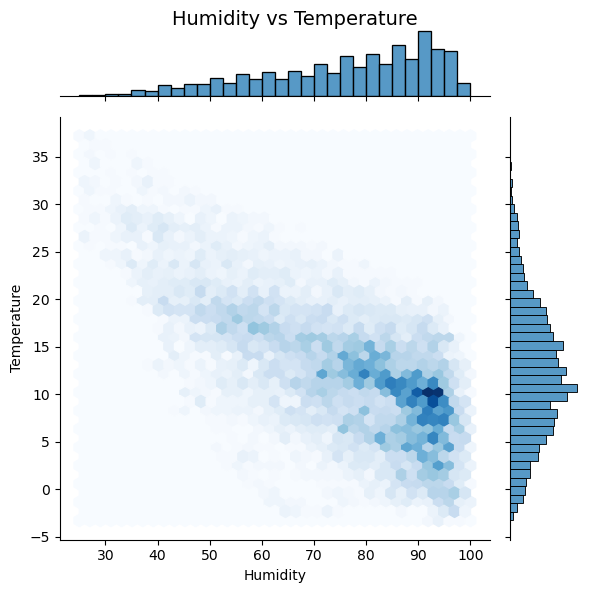

In [357]:
gr = sns.jointplot(data=df_ter, x="Humidity", y="Temperature", kind="hex", cmap="Blues")
gr.fig.suptitle("Humidity vs Temperature", fontsize=14)
gr.fig.tight_layout() 
gr.fig.subplots_adjust(top=0.95)

In [358]:
corr = df[["Temperature", "Humidity"]].head(8760).corr(method='pearson')
print("Correlation (Linear) :", corr.loc["Temperature", "Humidity"])

Correlation (Linear) : -0.6771964067639837


Text(0.5, 1.0, 'Hourly Mean Temperature by Month')

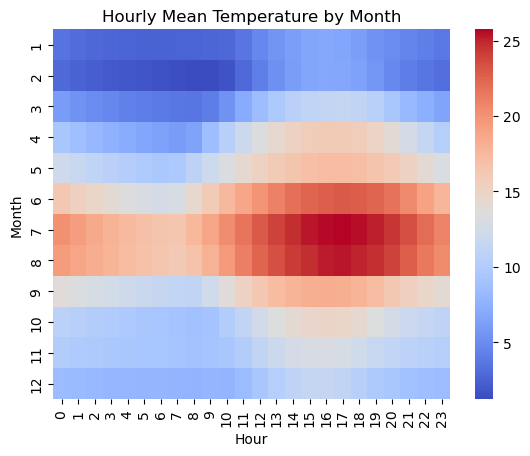

In [359]:
df_ter["Hour"] = df["Date"].head(8760).dt.hour
pivot = df_ter.groupby(["Month", "Hour"])["Temperature"].mean().unstack()

sns.heatmap(pivot, cmap="coolwarm")
plt.title("Hourly Mean Temperature by Month")

The first heatmap shows the link between temperatures according to the humidity levels and the months. During summer, the humidity level is lower than the other months and the temperatures are higher. As the humidity increases, the temperatures decreases. During winter, the humidity levels are higher than the other months and temperatures are lower.

The joint distribution between temperature and humidity shows a clear downward trend, with a high density of points concentrated around 80–100% humidity and 5–15°C. So, there is peak of density with a general shape. The linear correlation coefficient of -0.677 confirms a moderate to strong negative linear relationship. This suggests that humidity and temperature are dependent, with lower humidity typically associated with higher temperatures. However, the peak density suggests a specific zone of stability which may reflect common meteorological conditions in Paris.

The third graph is the second heatmap. It shows the temporal link between the temperature, month and hours. It confirms the temperatures are higher during summer (June, July and August) and between 2p.m. and 7p.m. There is a clear seasonal behavior that could be used in the forecasting model.

In [361]:
df['Temperature'] = df['Temperature'].astype(float)
df['Wind Speed'] = df['Wind Speed'].astype(float)
df['Cloud cover'] = df['Cloud cover'].astype(float)
df['Wind direction'] = df['Wind direction'].astype(float)
df['Humidity'] = df['Humidity'].astype(float)

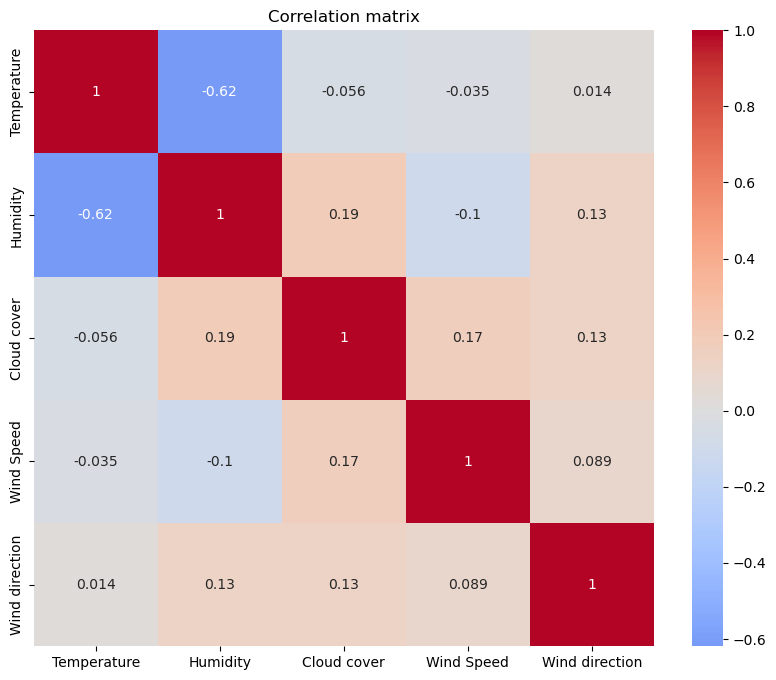

In [362]:
# Correlation matrix for the variables of the dataframe
corr_matrix = df.corr(numeric_only=True)

# Pearson heatmap
plt.figure(figsize=(10,8))
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True, center=0)
plt.title("Correlation matrix")
plt.show()

The correlation matrix underlines the linear correlation between temperatures and humidity which we previously observed. However, no other pairs of variables show significant linear correlations. This suggests that potential dependencies between variables may be non-linear or obscured by more complex interactions.

### Temporal functions

In [364]:
# Hour cycles
df['hour_sin'] = np.sin(2 * np.pi * df["Date"].dt.hour / 24)
df['hour_cos'] = np.cos(2 * np.pi * df["Date"].dt.hour / 24)

# Day cycles
df['day_sin'] = np.sin(2 * np.pi * df["Date"].dt.dayofyear / 365)
df['day_cos'] = np.cos(2 * np.pi * df["Date"].dt.dayofyear / 365)

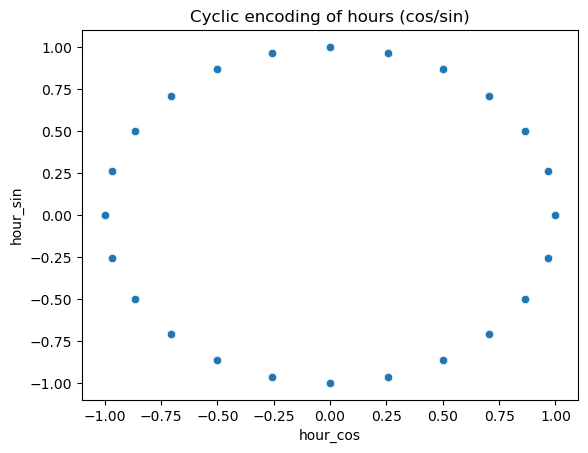

In [365]:
sns.scatterplot(x='hour_cos', y='hour_sin', data=df.sample(1000)) 
plt.title("Cyclic encoding of hours (cos/sin)")
plt.show()

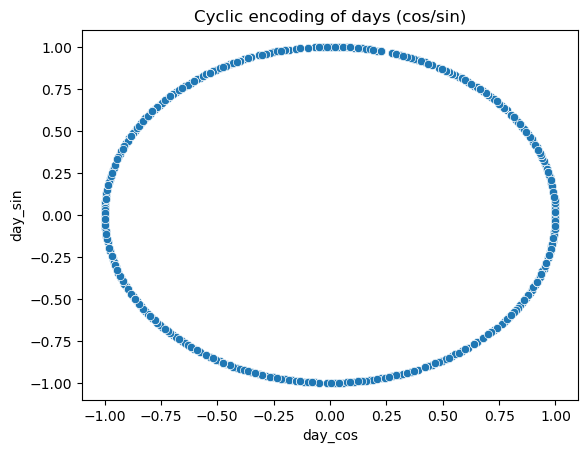

In [366]:
sns.scatterplot(x='day_cos', y='day_sin', data=df.sample(1000)) 
plt.title("Cyclic encoding of days (cos/sin)")
plt.show()

Cyclic functions are important to capture the temporal aspect of the data. Here the graphs cos/sin for the days and hours is a circle, it means the data is repeating. The key advantage of this encoding is that it preserves proximity in time — for example, the end of a day and the beginning of the next are close in the feature space, unlike in standard numerical encoding where they would appear far apart. To go further, we could explore the Fourier Transform, which allows us to decompose time series data into frequency components. This can help reveal hidden periodicities or seasonal patterns that may not be obvious in the time domain and could enrich our forecasting model but we cannot use it in this project.

### Review of the dataframe

In [385]:
pip install ydata-profiling

In [386]:
from ydata_profiling import ProfileReport

In [387]:
profile = ProfileReport(df, title="EDA Report - Weather Data", explorative=True)
profile.to_notebook_iframe()  # Print in a notebook
# Export
profile.to_file("eda_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 10/10 [00:00<00:00, 65.14it/s][A


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Features useful for the model

For the model, the variables of the dataframe will be used in input. The temporal data will be used as inputs too. In the model several encoders will encode the different inputs separately to build different features.